# Analyse graphique de la dynamique epidemique du COVID-19 en France

> Visualisation des variations de vitesse de propagation de l'épidémie dans le temps.

- toc: true
- branch: master
- hide: false
- search_exclude: false
- badges: true
- comments: false
- author: Alexandre Payot
- categories: [Visualisation, Data, Covid]

Ce post présente la dynamique de l'épidémie et propose des graphiques montrant différentes normalisations des données permettant de mesurer les variations de la vitesse de propagation du virus.

J'ai commencé ce projet en avril 2020, lorsque la dynamique de l'épidémie était très incertaine, durant le confinement en France. Mon objectif est de mettre à jour les données toutes les semaines pour permettre un suivi des chiffres loin du sensationnalisme et des sous-estimations que l'on peut retrouver dans les médias.

Dans ce contexte, l'accent est mis sur les données pondérées sur 7 jours, ce qui permet de lisser les fluctuations importantes que l'on observe entre les différents jours de la semaine. Vous retrouverez le code utilisé à l'adresse suivante : 
[payoto/covid19-viz](https://github.com/payoto/covid19-viz)


In [1]:
#hide
%load_ext autoreload
%autoreload 2

In [2]:
#collapse-hide
import pandas as pd
from matplotlib import pyplot as plt
import requests
import datetime
from IPython.display import display, Markdown
import viz

In [3]:
display(Markdown("Article mis à jour le {}".format(datetime.date.today().strftime("%d/%m/%Y"))))

Article mis à jour le 14/11/2020

## Mise à jour des commentaires

### Le 14/11/2020

Le deuxième confinement a fait son effet et le nombre de cas et de décès ont atteint leur pic dans la semaine du 2 et 9 Novembre respectivement. Le pic de réanimation et hospitalisations est attendu dans les jours à venir.

### Le 25/10/2020

Les tendances sont similaires à la semaine dernière et restent inquiétantes. 

Malgré on observe un ralentissement du nombre de décès (pic a +10%/jour le 18/10/2020). à cause des différentes moyennes glissantes les nombres pour cette semaine ne sont pas encore définitifs. Ce ralentissement est important car de manière contre-intuitive le pic de décès lors de la première vague intervint avant le pic de réanimation et le pic d'hospitalisations.

L'augmentation du nombre de cas reste stable à +5% par jour. Cette indicateurs n'est pas fiable vu le taux de positivité des tests. (~14%)

### Le 17/10/2020

Tous les indicateurs montrent une croissance exponentielle de la maladie et une deuxième vague sérieuse se profile.

Le taux d'accroissement journalier +5% pour tous les indicateurs.

### Le 11/10/2020

* Nous observons sur les trois dernières semaines une stabilisation du nombre de réanimation : nous observons une augmentation linéaire de 25 personnes en réanimation par jour. C'est un signe encourageant qui suggère que l'épidémie a ralenti il y a quelques semaines. Malheureusement ceci ne nous donne pas d'information sur la trajectoire des deux dernières semaines.
* Ajout du nombre de cas aux graphiques concernant la France.


### Le 27/09/2020

Aujourd'hui une vue agrandie sur les dernières semaines est ajoutée.

* Nous observons un phénomène surprenant d'une baisse de nombre de personne à l'hôpital, cela semble être un phénomène externe qui ne correspond pas à la dynamique de la maladie ;
* un relativement grand nombre de décès le 18/09 (80) sort de la tendance en cours.

### Le 20/09/2020

Deux points importants apparaissent dans les données :

* L'augmentation du nombre de personne en réanimation et hôpital semble se stabiliser autour de +5% par jour (doublement toutes les deux semaines) ;
* Sans surprise, les tendances en réanimations et hospitalisations commencent à apparaître dans les courbes de décès.


In [4]:
from viz import *

## Données de DataAgainst Covid-19

Les données utilisées sont celles de DataAgainst COVID-19 (aka opencovid19-fr) [github.com/opencovid19-fr/data]. Elles sont mises à jour quotidiennement.


In [5]:
#collapse-hide
file_name = 'opencovid19-fr-chiffres-cles.csv'
url = 'https://raw.githubusercontent.com/opencovid19-fr/data/master/dist/chiffres-cles.csv'
myfile = requests.get(url)
open(file_name, 'wb').write(myfile.content)
data = pd.read_csv('opencovid19-fr-chiffres-cles.csv')

In [6]:
#hide
data.columns

Index(['date', 'granularite', 'maille_code', 'maille_nom', 'cas_confirmes',
       'cas_ehpad', 'cas_confirmes_ehpad', 'cas_possibles_ehpad', 'deces',
       'deces_ehpad', 'reanimation', 'hospitalises',
       'nouvelles_hospitalisations', 'nouvelles_reanimations', 'gueris',
       'depistes', 'source_nom', 'source_url', 'source_archive',
       'source_type'],
      dtype='object')

In [7]:
data.tail()

,date,granularite,maille_code,maille_nom,cas_confirmes,cas_ehpad,cas_confirmes_ehpad,cas_possibles_ehpad,deces,deces_ehpad,reanimation,hospitalises,nouvelles_hospitalisations,nouvelles_reanimations,gueris,depistes,source_nom,source_url,source_archive,source_type
32306,2020-11-13,region,REG-76,Occitanie,NaN,NaN,NaN,NaN,1284.0,NaN,398.0,2205.0,204.0,45.0,6693.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
32307,2020-11-13,region,REG-84,Auvergne-Rhône-Alpes,NaN,NaN,NaN,NaN,3844.0,NaN,828.0,6910.0,553.0,80.0,17126.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
32308,2020-11-13,region,REG-93,Provence-Alpes-Côte d'Azur,NaN,NaN,NaN,NaN,2167.0,NaN,512.0,3301.0,267.0,58.0,12898.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
32309,2020-11-13,region,REG-94,Corse,NaN,NaN,NaN,NaN,98.0,NaN,14.0,84.0,4.0,0.0,401.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
32310,2020-11_11,pays,FRA,France,1865538.0,NaN,NaN,NaN,29272.0,13263.0,4803.0,31946.0,2588.0,351.0,133696.0,NaN,Ministère des Solidarités et de la Santé,NaN,NaN,ministere-sante


In [8]:
#hide
for a in data[["maille_code", "maille_nom"]].groupby(["maille_code", "maille_nom"]):
    print(f"{a[0]}")

('COM-974', 'La Réunion')
('COM-977', 'Saint-Barthélemy')
('COM-978', 'Saint-Martin')
('COM-986', 'Wallis et Futuna')
('COM-987', 'Polynésie française')
('COM-988', 'Nouvelle-Calédonie')
('DEP-01', 'Ain')
('DEP-02', 'Aisne')
('DEP-03', 'Allier')
('DEP-04', 'Alpes-de-Haute-Provence')
('DEP-05', 'Hautes-Alpes')
('DEP-06', 'Alpes-Maritimes')
('DEP-07', 'Ardèche')
('DEP-08', 'Ardennes')
('DEP-09', 'Ariège')
('DEP-10', 'Aube')
('DEP-11', 'Aude')
('DEP-12', 'Aveyron')
('DEP-13', 'Bouches-du-Rhône')
('DEP-14', 'Calvados')
('DEP-15', 'Cantal')
('DEP-16', 'Charente')
('DEP-17', 'Charente-Maritime')
('DEP-18', 'Cher')
('DEP-19', 'Corrèze')
('DEP-21', "Côte-d'Or")
('DEP-22', "Côtes-d'Armor")
('DEP-23', 'Creuse')
('DEP-24', 'Dordogne')
('DEP-25', 'Doubs')
('DEP-26', 'Drôme')
('DEP-27', 'Eure')
('DEP-28', 'Eure-et-Loir')
('DEP-29', 'Finistère')
('DEP-2A', 'Corse-du-Sud')
('DEP-2B', 'Haute-Corse')
('DEP-30', 'Gard')
('DEP-31', 'Haute-Garonne')
('DEP-32', 'Gers')
('DEP-33', 'Gironde')
('DEP-34', 'Hér

In [9]:
data = enable_time_series_plot(data, timein_field="date", timeseries_field_out="t")

## Dernières données pour la France

Ici, nous tabulons les derniers jours de données pour la France. Les données brutes ainsi que les données avec une moyenne glissante sur 7 jours sont calculées. Nous n'observons que les réanimations, les hospitalisations et les décès. Les données de cas confirmés ont longtemps été insuffisantes pour permettre une analyse intelligente de l'épidémie.

Dans les graphiques ci-après nous analysons trois types de données :

* les données brutes d'entrées en réanimation et de décès ;
* ces même données pondérées sur 7 jours ;
* ces données pondérées normalisée par le nombre de personnes en réanimation.

Ce troisième graphique donne donc une indication de l'accélération ou ralentissement, même lorsque les données sont d'ampleurs très différentes.


,deces,deces_ehpad,reanimation,hospitalises,cas_confirmes,reanimation_cumul,hospitalises_cumul,deces_jour,deces_jour_jour,deces_ehpad_jour,...,deces_ehpad_jour_mma_jour,deces_jour_prop,deces_ehpad_jour_prop,reanimation_jour_prop,hospitalises_jour_prop,cas_confirmes_jour_prop,reanimation_cumul_jour_prop,hospitalises_cumul_jour_prop,reanimation_solde_vivant_jour_prop,deces_jour_mma_jour_prop
t,,,,,,,,,,,,,,,,,,,,,
2020-11-04,26595.0,12079.0,4089.0,27534.0,1543321.0,447901.0,2999990.0,385.0,-41.0,0.0,...,0.000000,0.011662,0.008492,0.036474,0.038015,0.028527,0.008057,0.008065,0.112322,0.064947
2020-11-05,26958.0,12079.0,4230.0,28426.0,1601367.0,452131.0,3028416.0,363.0,-22.0,0.0,...,0.000000,0.012183,0.008492,0.036272,0.036400,0.028422,0.008321,0.008331,0.113914,0.055676
2020-11-06,27356.0,12509.0,4331.0,28979.0,1661853.0,456462.0,3057395.0,398.0,35.0,430.0,...,20.000000,0.012752,0.009799,0.031467,0.033537,0.028356,0.008540,0.008570,0.112016,0.058559
2020-11-07,27660.0,12509.0,4421.0,29421.0,1748705.0,460883.0,3086816.0,304.0,-94.0,0.0,...,0.000000,0.013031,0.009799,0.031312,0.031003,0.031132,0.008759,0.008784,0.112838,0.032105
2020-11-08,27930.0,12509.0,4539.0,30243.0,1787324.0,465422.0,3117059.0,270.0,-34.0,0.0,...,0.000000,0.013104,0.009799,0.030246,0.029343,0.029846,0.008968,0.008983,0.110880,0.015222
2020-11-09,28478.0,12509.0,4690.0,31125.0,1807479.0,470112.0,3148184.0,548.0,278.0,0.0,...,0.000000,0.013514,0.009799,0.029242,0.027456,0.026955,0.009170,0.009166,0.111301,0.048998
2020-11-10,28944.0,13263.0,4750.0,31505.0,1829659.0,474862.0,3179689.0,466.0,-82.0,754.0,...,46.571429,0.013494,0.012753,0.026226,0.023760,0.025524,0.009341,0.009311,0.108451,0.014631
2020-11-11,29272.0,13263.0,4803.0,31946.0,1865538.0,479665.0,3211635.0,328.0,-138.0,0.0,...,0.000000,0.013065,0.012753,0.021237,0.019730,0.024674,0.009460,0.009414,0.100860,-0.021292
2020-11-12,29697.0,13263.0,4899.0,32683.0,1898710.0,484564.0,3244318.0,425.0,97.0,0.0,...,0.000000,0.013176,0.012753,0.019508,0.018607,0.022372,0.009562,0.009507,0.099379,0.022636


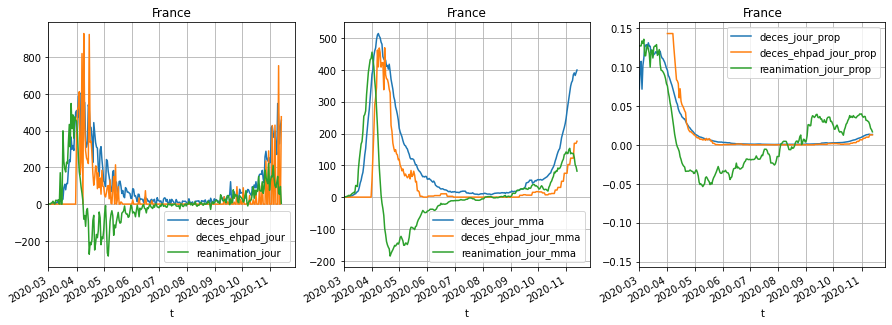

In [10]:
#collapse-hide

maille_active = 'FRA'
fra = oc19_data_preproc(data, maille_active)
fra.tail(10)

Dans ce graphe nous montrons les étâts les plus critiques de la maladie: les décès et les réanimations. Vu que chaque jour la donnée publiée est le nombre total de personne en réanimation, et que nous cherchons l'évolution nous calculons la différence entre chaques jours. Il faut aussi prendre en compte qu'un décès, de manière assez cynique "libère" un lit en réanimation. Pour éviter de voir une amélioration de la situation lorsque le taux de mortalité augmente, nous regardons aussi le "solde vivant" en réanimation: `nombre entrant` - `nombre sortant vivant` de réanimation.

## Dynamique de l'épidémie

Dans les graphiques qui suivent nous regardons sur l'axe des abscisses le nombre de personnes dans un état donné de maladie COVID. Vous retrouvez ces valeurs sur le graphique de gauche.

Au milieu, l'axe des ordonnées représente le changement de jour en jour de l'axe des abscisses, les points indique les données brutes, et la ligne les données moyennées.

A droite, ces mêmes données de l'axe des ordonnées sont normalisées pour indiquer un changement en pourcents par jour.

Chaque couleur correspond à une semaine.


In [11]:
#collapse-hide
def plots_maille_code(maille_active='FRA', **kwargs):
    fra = oc19_data_preproc(data, maille_active)
    plt.close()
    # plot_field_loops(fra, "deces_ehpad", center=False, maille_active=maille_active)
    plot_field_loops(fra, "hospitalises_cumul", [7], center=True, maille_active=maille_active, **kwargs)
    plot_field_loops(fra, "reanimation_cumul", [7], center=True, maille_active=maille_active, **kwargs)
    plot_field_loops(fra, "deces", center=True, maille_active=maille_active, **kwargs)
    if maille_active == "FRA":
        plt.show()
        display(Markdown(
            "Pour la France le nombre de cas peut-être analysé. Contrairement aux autres"
            + " quantités le nombre de cas est lissé sur 14 jours avec une fenêtre triangulaire."
        ))
        plot_field_loops(
            fra, "cas_confirmes", [14], center=True, maille_active=maille_active,
            win_type='triang', **kwargs
        )
    return fra


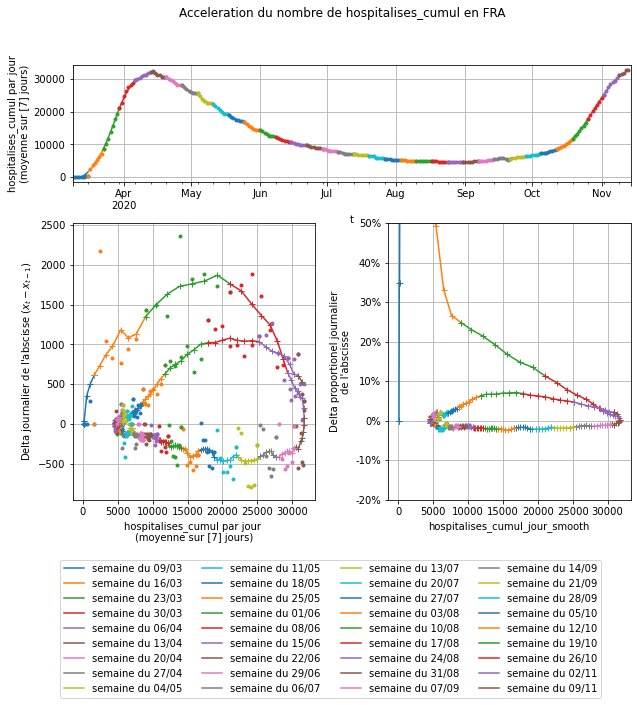

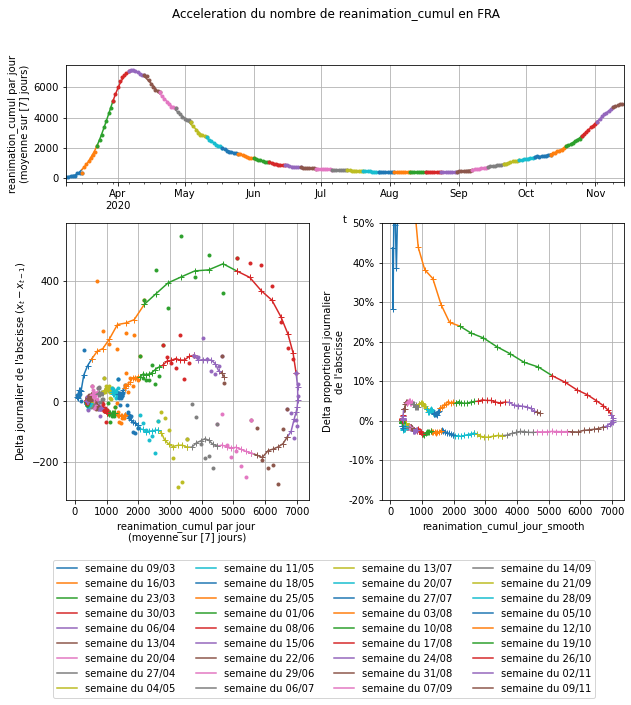

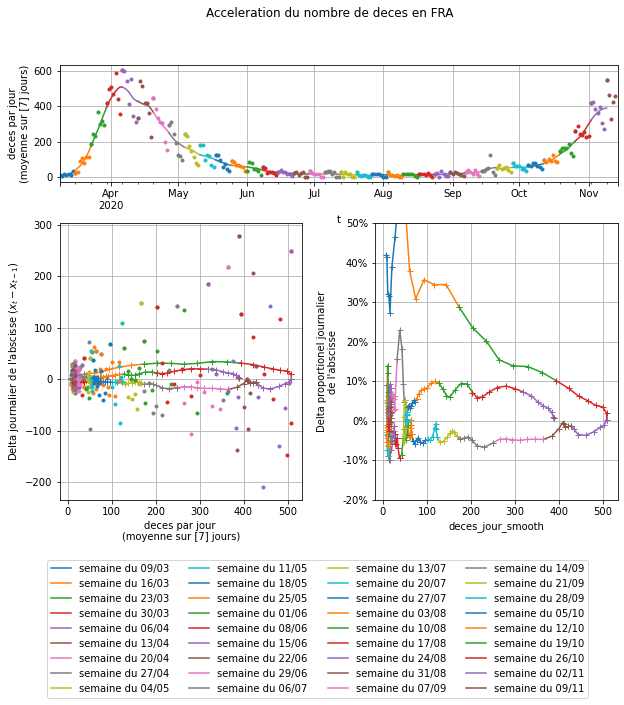

Pour la France le nombre de cas peut-être analysé. Contrairement aux autres quantités le nombre de cas est lissé sur 14 jours avec une fenêtre triangulaire.

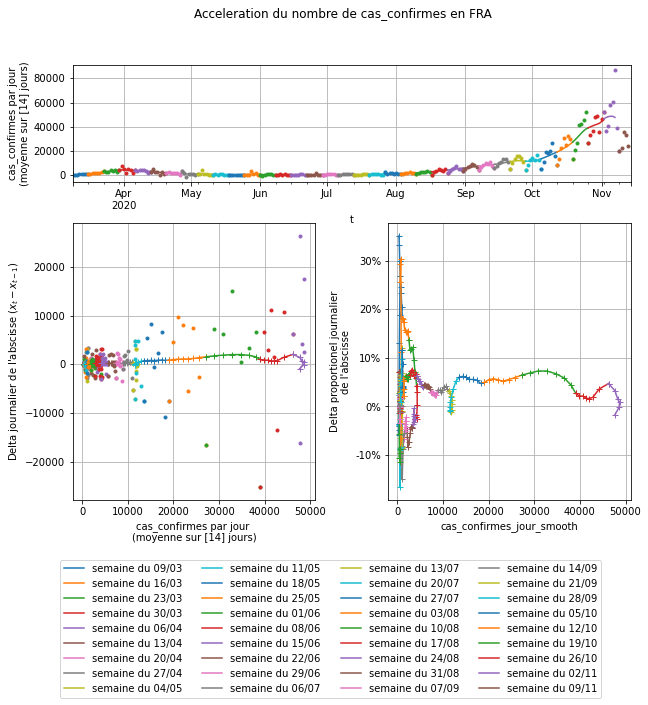

In [12]:
_ = plots_maille_code(maille_active='FRA')

Il est intéressant de zoomer sur les données depuis la fin du confinement.

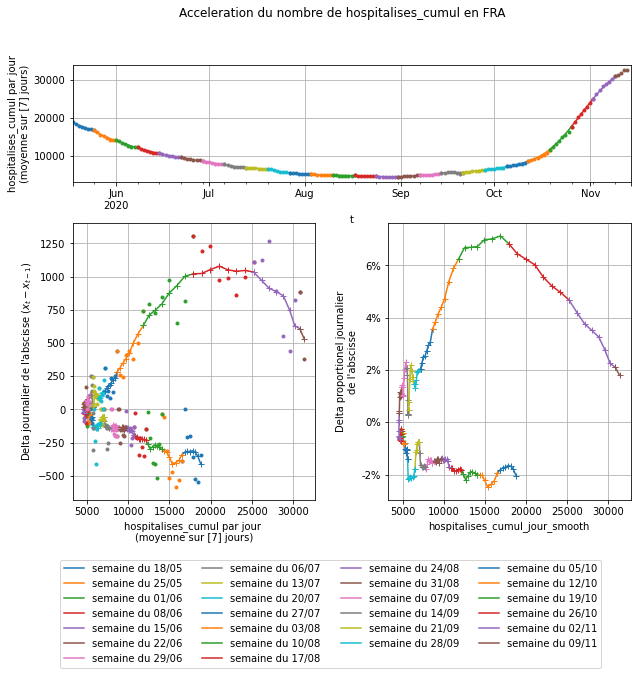

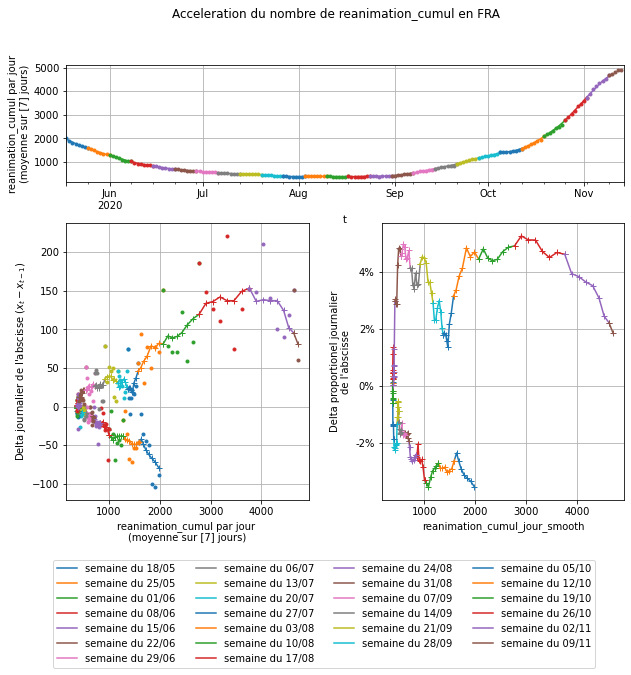

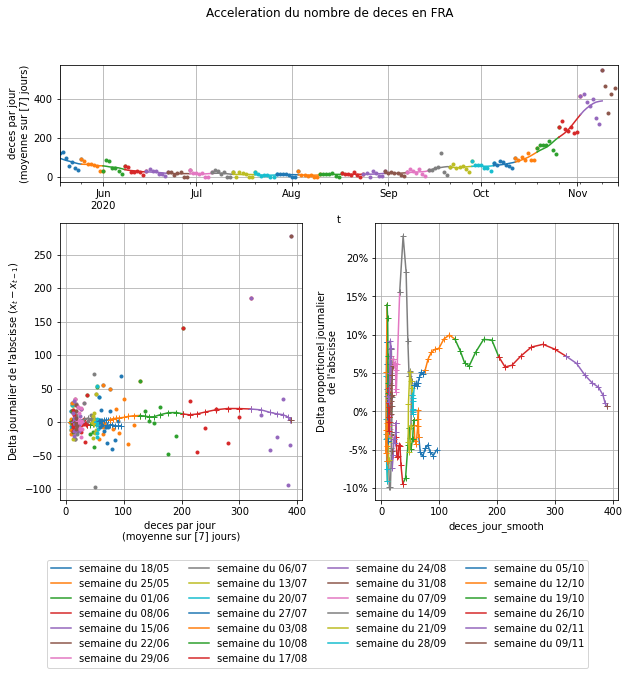

Pour la France le nombre de cas peut-être analysé. Contrairement aux autres quantités le nombre de cas est lissé sur 14 jours avec une fenêtre triangulaire.

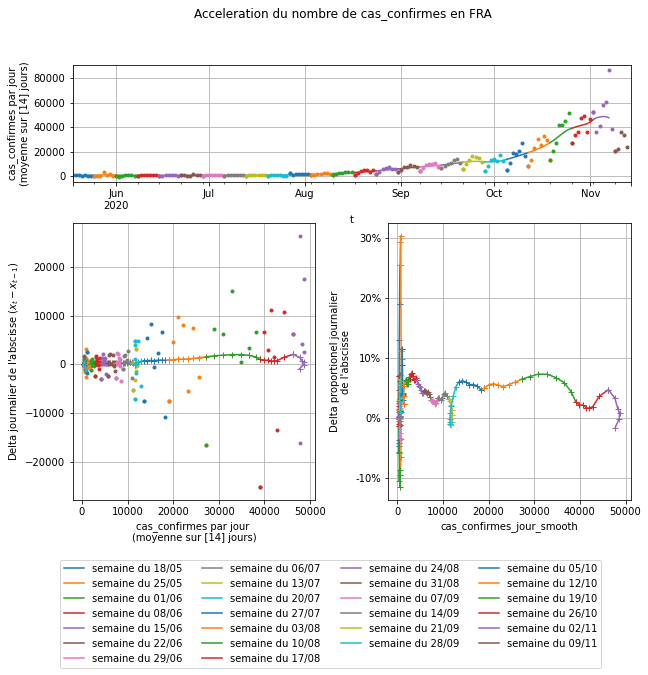

In [13]:
_ = plots_maille_code(maille_active='FRA', start_date='2020-05-18')

Ces courbes évoluent en boucles (ou en spirale en cas de plusieurs vagues successives) :

* Au début de l'épidémie les courbes commencent à l’origine ;
* puis se suit une accélération rapide dans la partie supérieure du graphique ;
* avec le confinement l'augmentation de jour en jour ralenti, cela se voit à la pente négative dès la semaine du 23 Mars ;
* l'épidémie atteint son pic la semaine du 06 Avril ;
* Nous voyons ensuite une réduction stable autour de 5% par jour jusqu'à la semaine du 08 Juin ;
* La période estivale indique bien que l'épidémie n'allait pas disparaître car ne retournant pas à l’origine ;
* depuis le 15 Août le nombre de d'hospitalisations et de réanimation s'accroit et c'est la deuxième semaine de Septembre qui semble indiqué qu'une deuxième vague a commencé.

Une deuxième vague se manifestera comme une spirale dans les graphiques au-dessus.


### Dynamique en Ile de France

Ici les mêmes graphiques sont présentés pour l'île de France. 

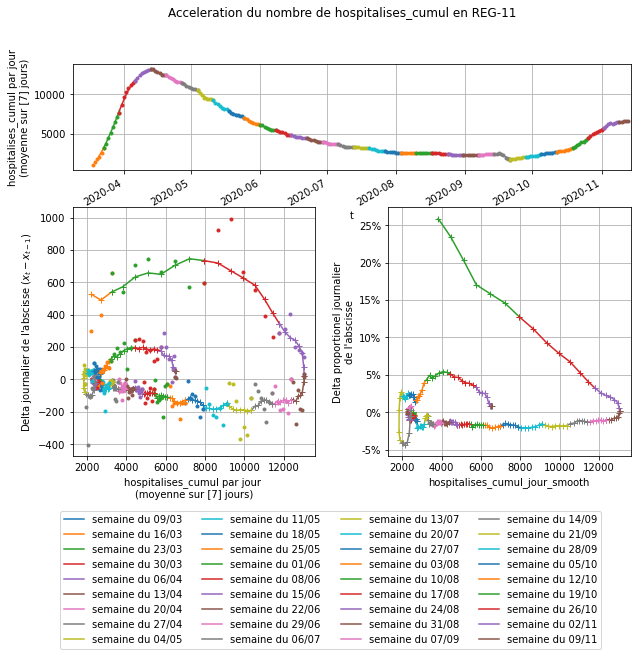

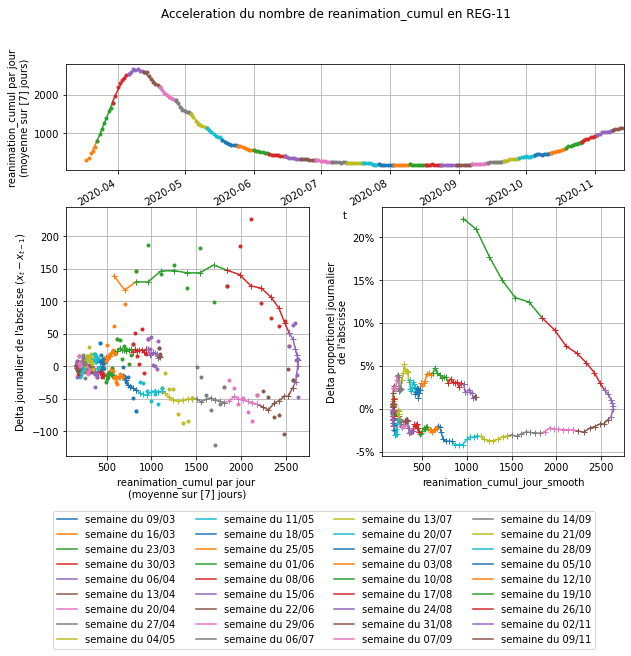

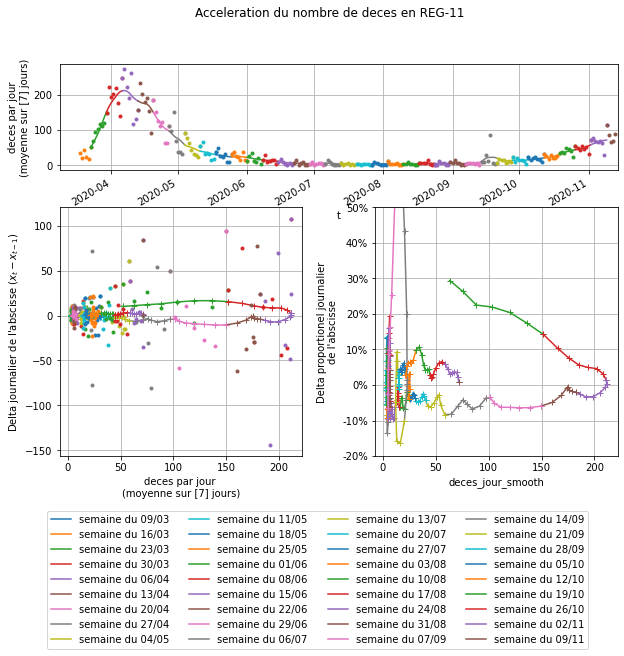

In [14]:
_ = plots_maille_code(maille_active='REG-11')

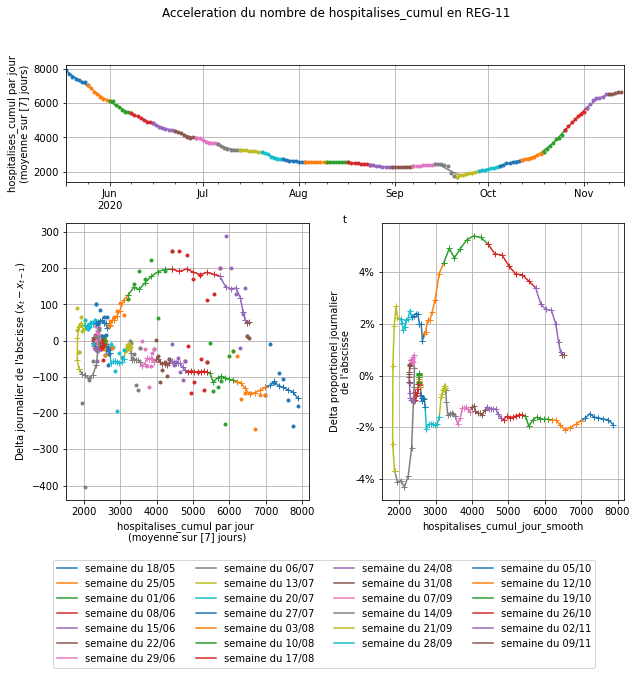

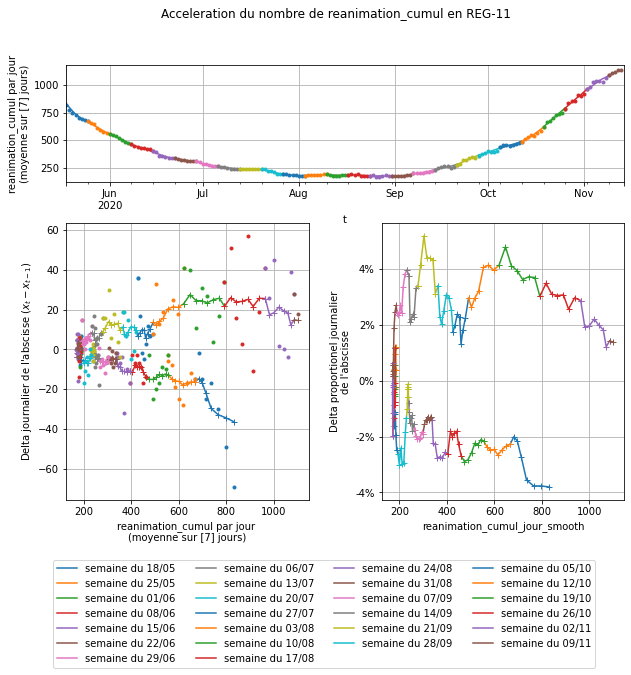

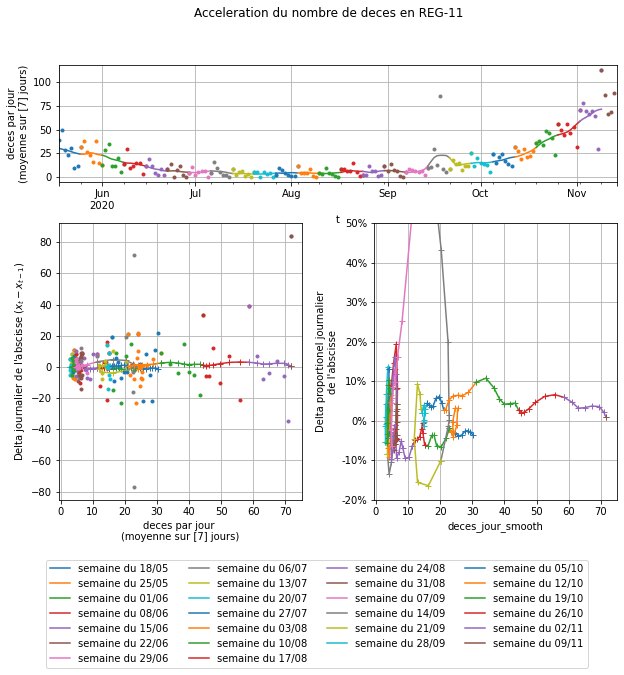

In [15]:
_ = plots_maille_code(maille_active='REG-11', start_date='2020-05-18')

## Graphes par régions

Pour chaque région les nombres de réanimation et de décès ainsi que leur dynamique sont présentées ci-dessous.

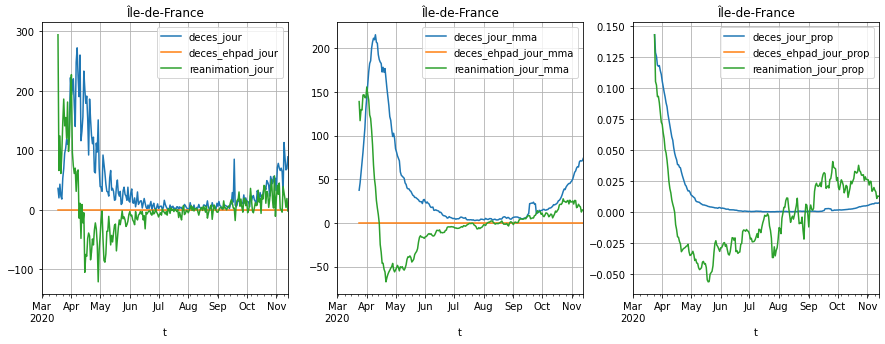

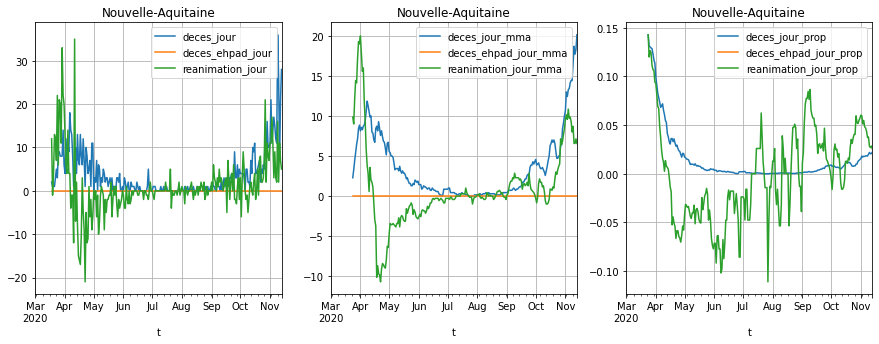

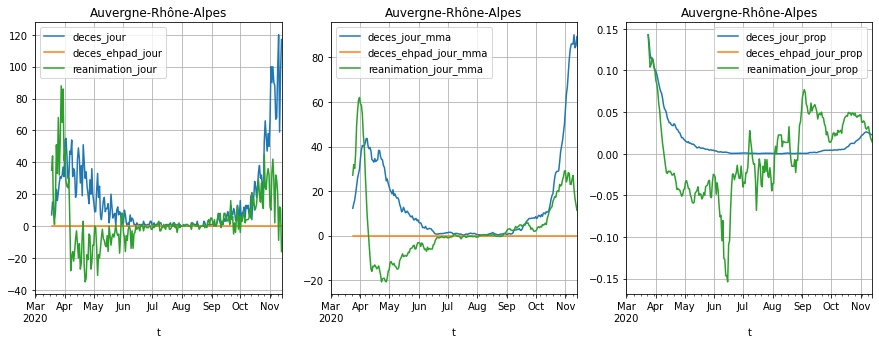

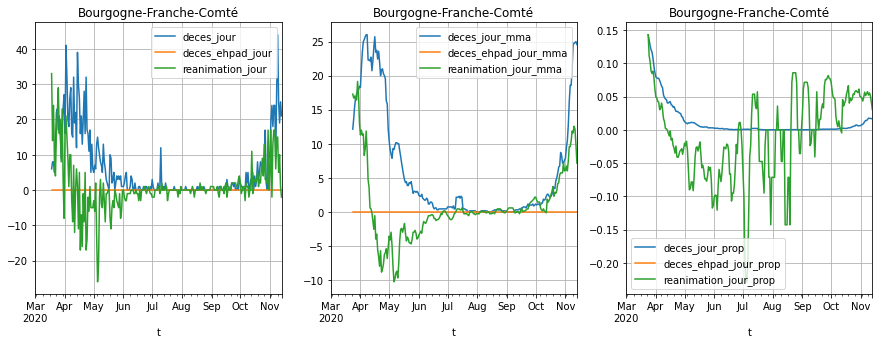

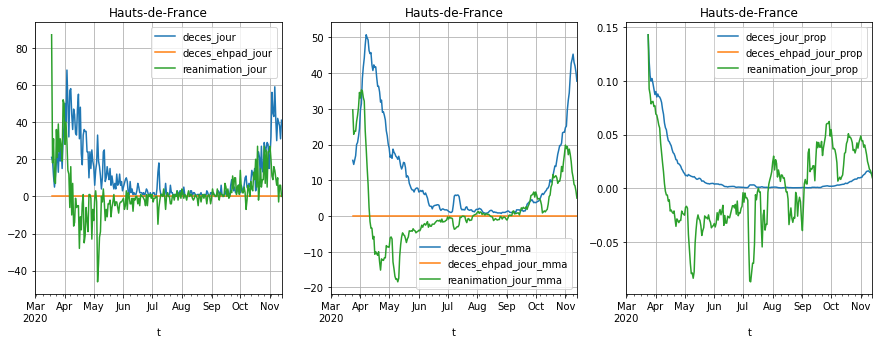

...

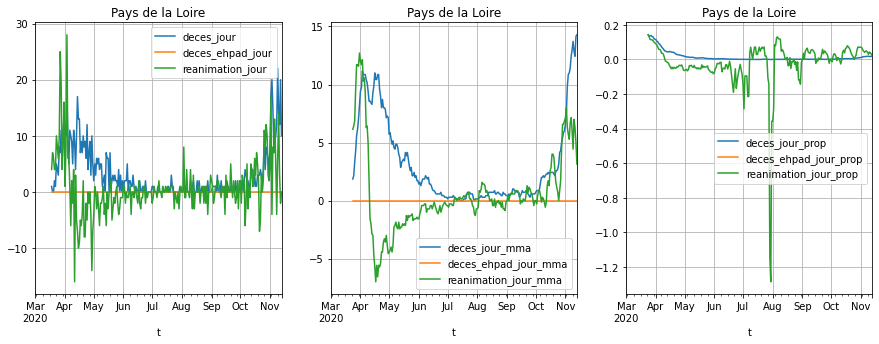

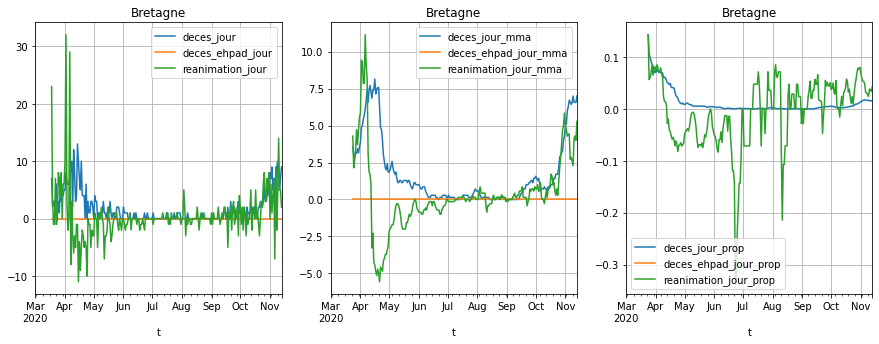

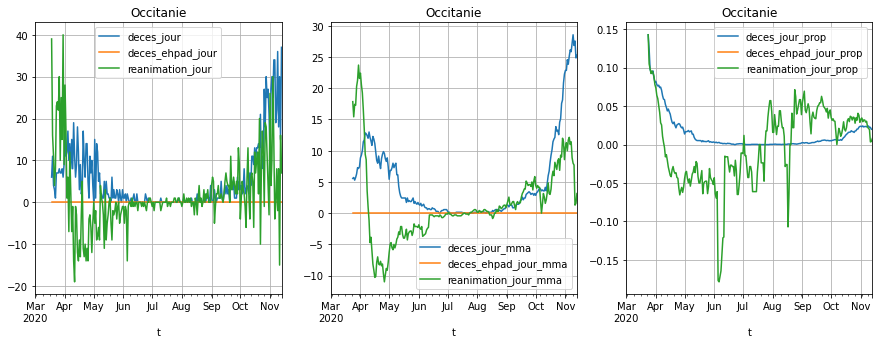

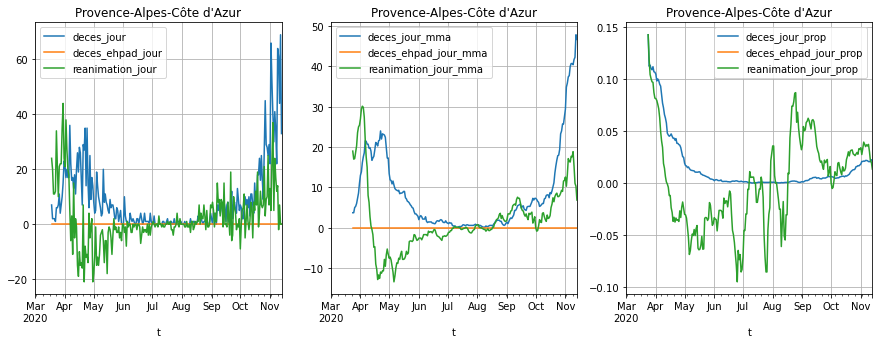

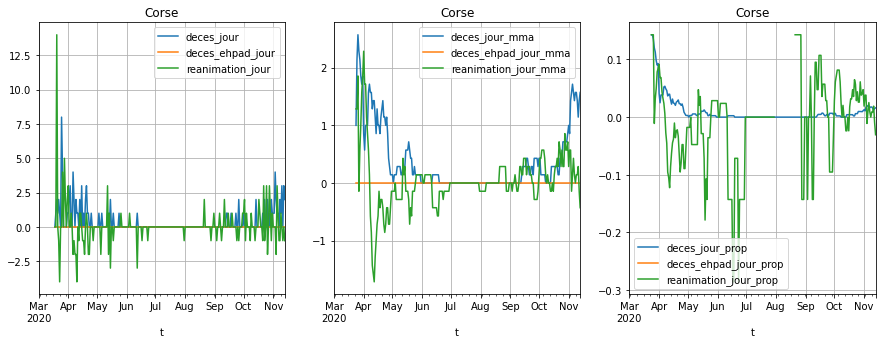

In [16]:
list_reg = [r for r in data["maille_code"].unique() if "REG" in r]
for reg in list_reg:
    oc19_data_preproc(data, reg)